# Finding blobs in 64x64 images using Unet, Conv3d

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from scipy.optimize import curve_fit
from PIL import Image
import random
import utils

In [2]:
data='/media/smc/RNAFish/DeepLearning/'

# Get data

Load data from file

In [3]:
shp=[1,256,256,7]

In [11]:
train_both=utils.get_raw_float_image(data+'TrainingA1.raw',shp)
train_data=train_both[:,:,:,[0,3]]/4096.0
train_truth=train_both[:,:,:,4]/255.0

In [12]:
validation_both=utils.get_raw_float_image(data+'Validation.raw', shp)
validation_data=validation_both[:,:,:,[0,3]]/4096.0
validation_truth=validation_both[:,:,:,4]/255.0

# Parse data

Mix the two datasets (rotated truths, normal images) and get training/validation sets

# Design network

Define a function to create a convolutional layer, including conv, relu, maxpool, that can be called multiple times

In [6]:
#Input and output
x=tf.placeholder(dtype=tf.float32, shape=[None, 256,256,2])
y=tf.placeholder(dtype=tf.float32, shape=[None, 256,256])

xr=x
yr=tf.reshape(y,[-1,256,256,1])

base_scaler=32

#Going down
A1=(tf.layers.conv2d(xr, base_scaler, [5,5], padding='SAME'))
A2=(tf.layers.conv2d(A1, base_scaler, [3,3], padding='SAME'))

B0=tf.nn.max_pool(A2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
B1=(tf.layers.conv2d(B0, 2*base_scaler, [3,3], padding='SAME'))
B2=(tf.layers.conv2d(B1, 2*base_scaler, [3,3], padding='SAME'))

C0=tf.nn.max_pool(B2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
C1=(tf.layers.conv2d(C0, 4*base_scaler, [3,3], padding='SAME'))
C2=(tf.layers.conv2d(C1, 4*base_scaler, [3,3], padding='SAME'))

D0=tf.nn.max_pool(C2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
D1=(tf.layers.conv2d(D0, 8*base_scaler, [3,3], padding='SAME'))
D2=(tf.layers.conv2d(D1, 8*base_scaler, [3,3], padding='SAME'))

E0=tf.nn.max_pool(D2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
E1=(tf.layers.conv2d(E0, 16*base_scaler, [3,3], padding='SAME'))
E2=(tf.layers.conv2d(E1, 16*base_scaler, [3,3], padding='SAME'))

F0=tf.nn.max_pool(E2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')
F1=(tf.layers.conv2d(F0, 16*base_scaler, [3,3], padding='SAME'))
F2=(tf.layers.conv2d(F1, 16*base_scaler, [3,3], padding='SAME'))



#Coming up
EE0=tf.layers.conv2d_transpose(F2, 8*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
EE1=tf.concat(axis=3, values=[EE0,E2])
EE2=(tf.layers.conv2d(EE1, 8*base_scaler, [3,3], padding='SAME'))
EE3=(tf.layers.conv2d(EE2, 8*base_scaler, [3,3], padding='SAME'))

DD0=tf.layers.conv2d_transpose(EE2, 8*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
DD1=tf.concat(axis=3, values=[DD0,D2])
DD2=(tf.layers.conv2d(DD1, 8*base_scaler, [3,3], padding='SAME'))
DD3=(tf.layers.conv2d(DD2, 8*base_scaler, [3,3], padding='SAME'))

CC0=tf.layers.conv2d_transpose(DD3, 4*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
CC1=tf.concat(axis=3, values=[CC0,C2])
CC2=(tf.layers.conv2d(CC1, 4*base_scaler, [3,3], padding='SAME'))
CC3=(tf.layers.conv2d(CC2, 4*base_scaler, [3,3], padding='SAME'))

BB0=tf.layers.conv2d_transpose(CC3, 2*base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
#BB0=tf.contrib.layers.conv2d_transpose(C2, 2*base_scaler, kernel_size=[3,3], stride=[2, 2], padding='SAME')
BB1=tf.concat(axis=3, values=[BB0,B2])
BB2=(tf.layers.conv2d(BB1, 2*base_scaler, [3,3], padding='SAME'))
BB3=(tf.layers.conv2d(BB2, 2*base_scaler, [3,3], padding='SAME'))

AA0=tf.layers.conv2d_transpose(BB3, base_scaler, kernel_size=[3,3], strides=[2, 2], padding='SAME')
AA1=tf.concat(axis=3, values=[AA0,A2])
AA2=(tf.layers.conv2d(AA1, base_scaler, [3,3], padding='SAME'))
AA3=(tf.layers.conv2d(AA2, base_scaler, [3,3], padding='SAME'))

logits=utils.leaky_relu(tf.layers.conv2d(AA3, 1, [1,1], padding='SAME'))
probs=tf.tanh(logits)

diff=tf.subtract(probs, yr)
LSQ=tf.multiply(diff,diff)
#Added this to make the outlines more potent in error function
#OutError, MaskError=tf.split(LSQ, [1,1], 3)
#loss=10*tf.reduce_mean(OutError)+0.1*tf.reduce_mean(MaskError)
loss=tf.reduce_mean(LSQ)

train_op=tf.train.AdamOptimizer(learning_rate=0.0001).minimize(loss)

# Training on easy set

0
Training loss:  0.00278102
(50, 256, 256, 1)
Validation loss:  0.000569918


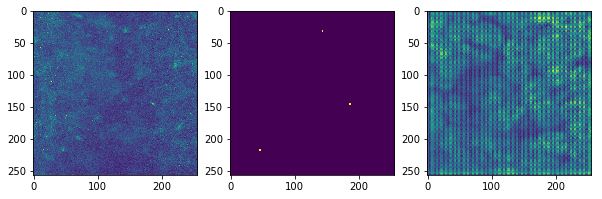

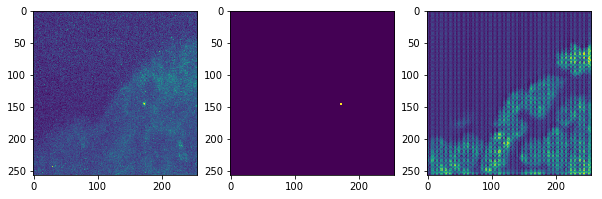

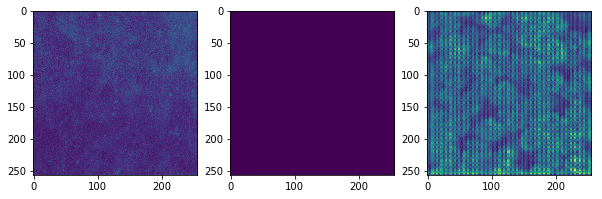

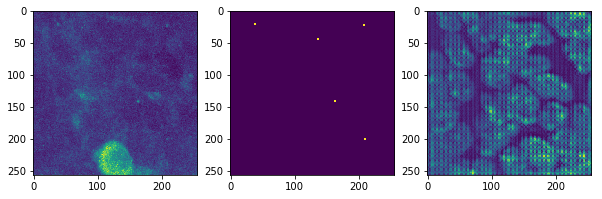

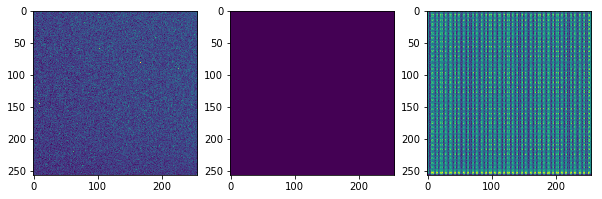

100
Training loss:  0.000643378
(50, 256, 256, 1)
Validation loss:  0.000278192


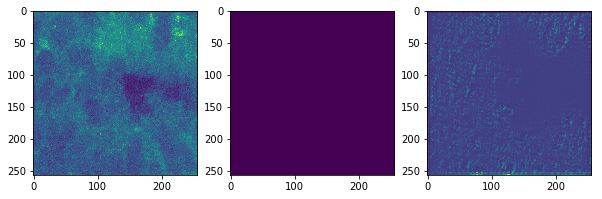

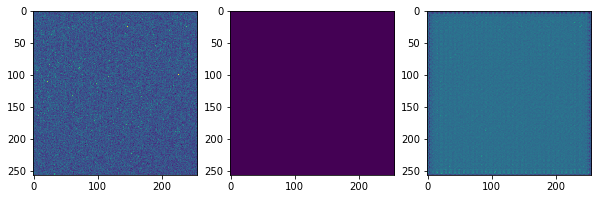

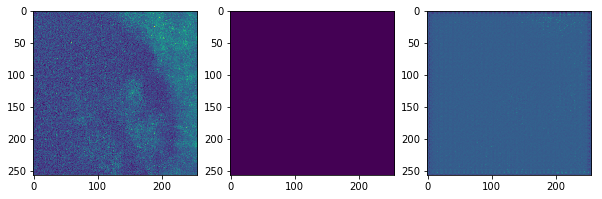

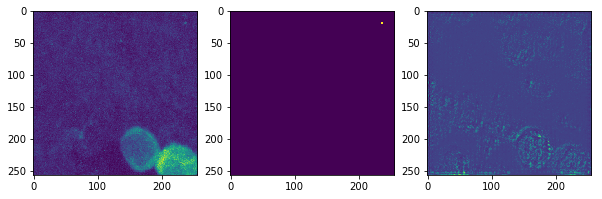

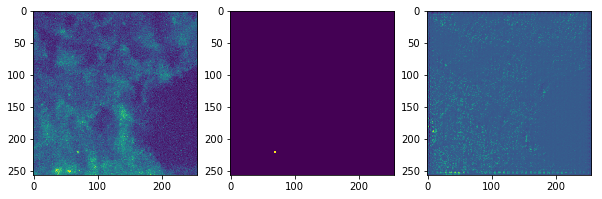

200
Training loss:  0.000711246
(50, 256, 256, 1)
Validation loss:  0.000196977


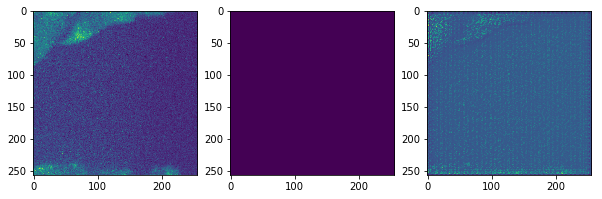

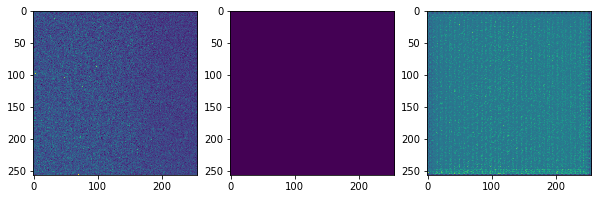

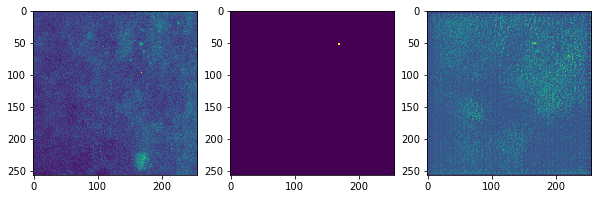

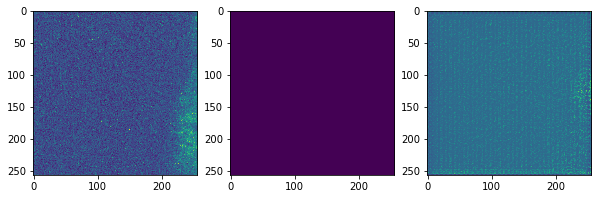

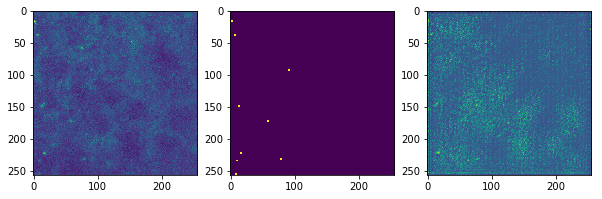

300
Training loss:  0.00056423
(50, 256, 256, 1)
Validation loss:  0.000191089


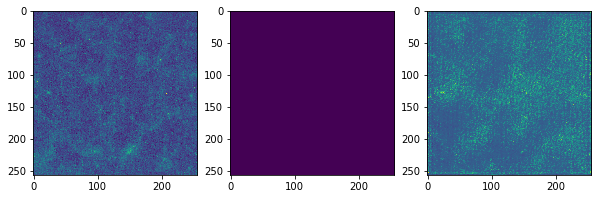

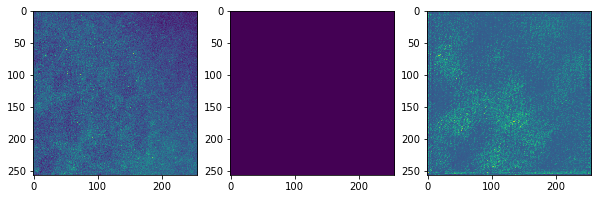

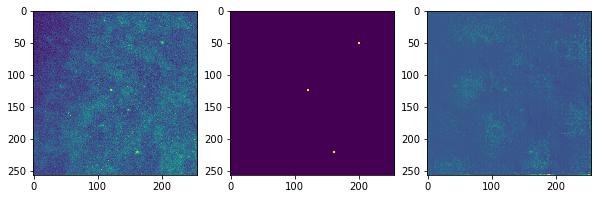

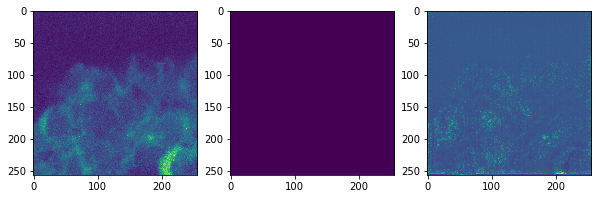

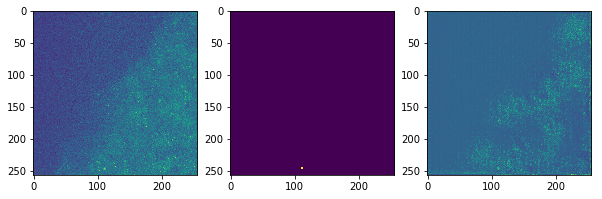

400
Training loss:  0.000675998
(50, 256, 256, 1)
Validation loss:  0.000209858


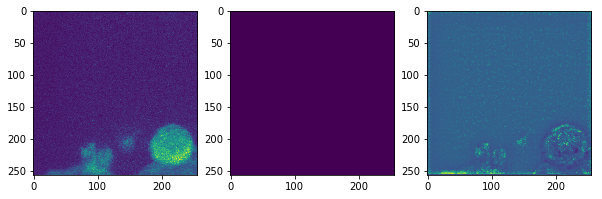

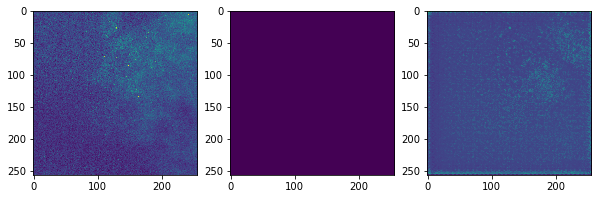

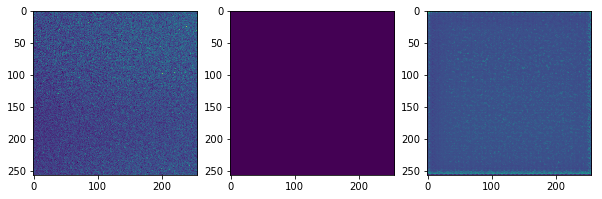

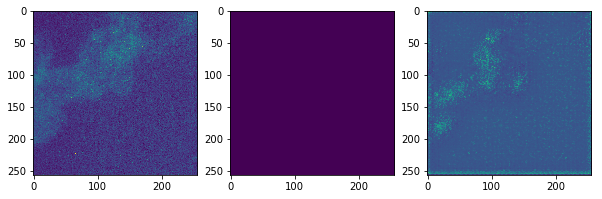

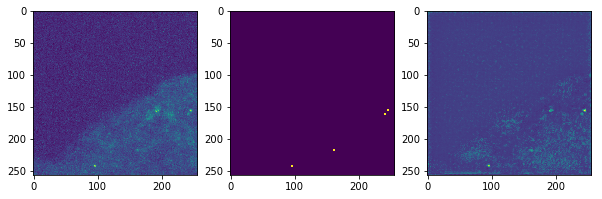

500
Training loss:  0.000590976
(50, 256, 256, 1)
Validation loss:  0.000219034


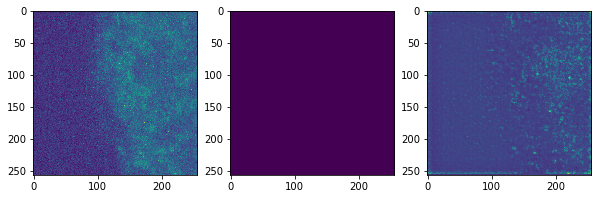

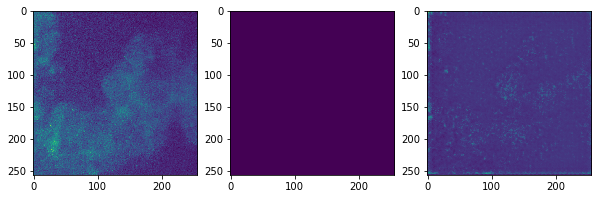

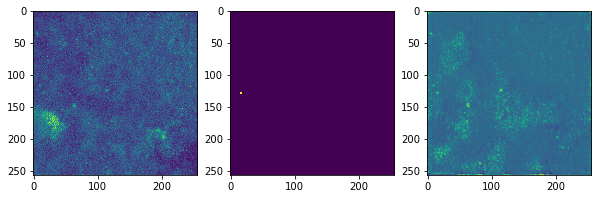

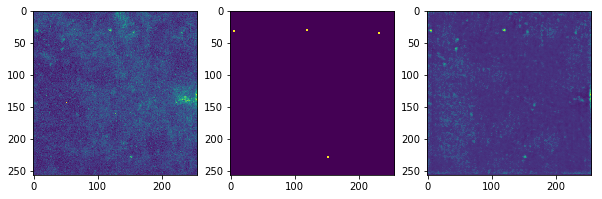

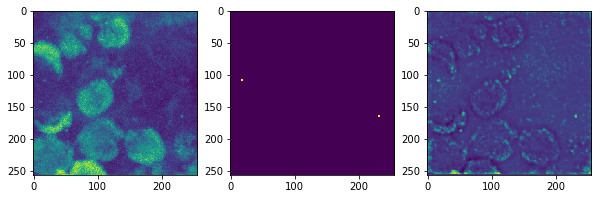

600
Training loss:  0.000698641
(50, 256, 256, 1)
Validation loss:  0.000342219


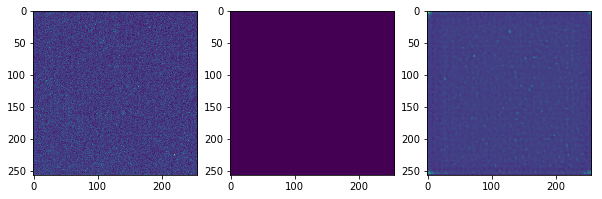

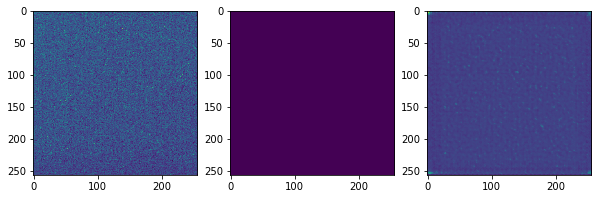

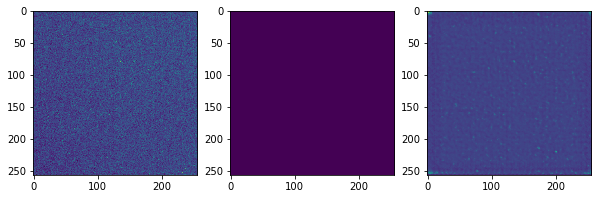

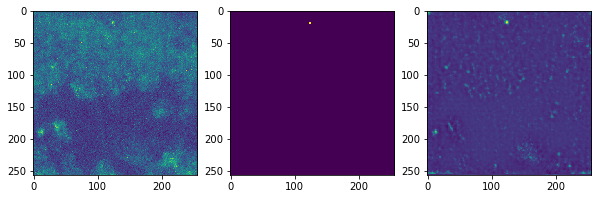

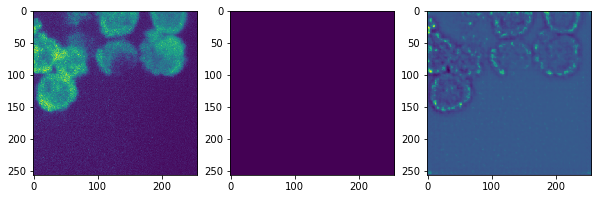

700
Training loss:  0.000571225
(50, 256, 256, 1)
Validation loss:  0.000246289


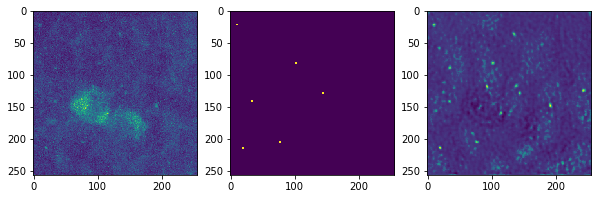

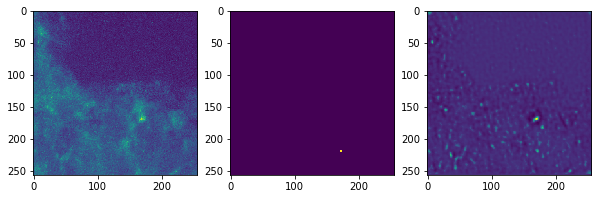

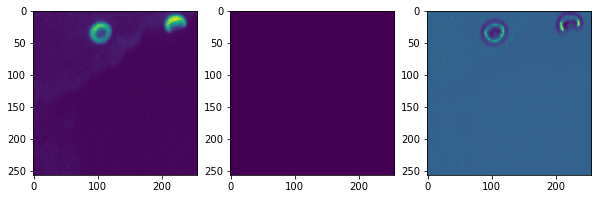

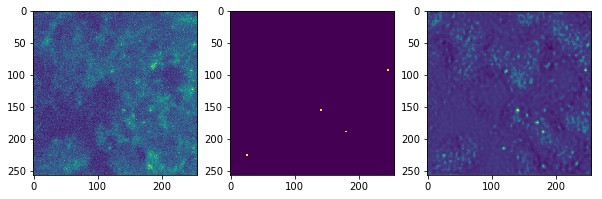

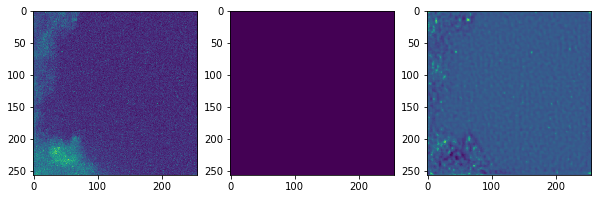

800
Training loss:  0.000608116
(50, 256, 256, 1)
Validation loss:  0.000284481


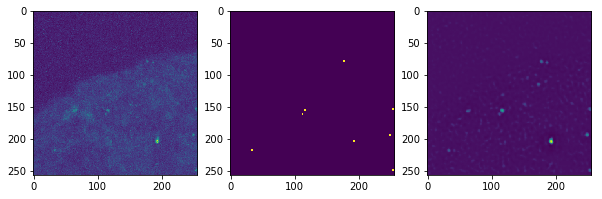

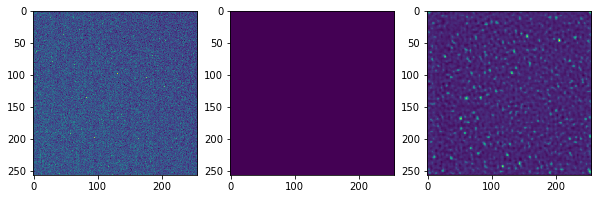

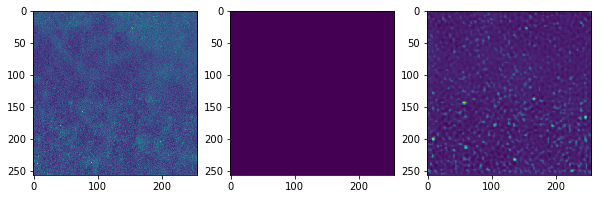

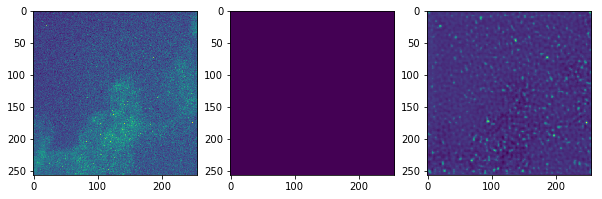

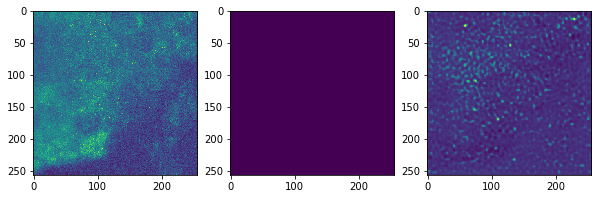

900
Training loss:  0.000523999
(50, 256, 256, 1)
Validation loss:  0.000266479


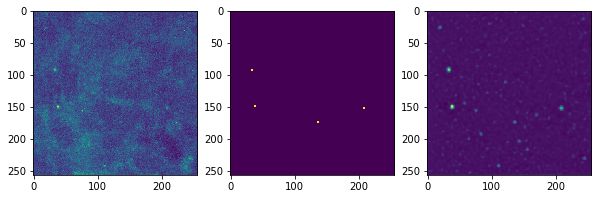

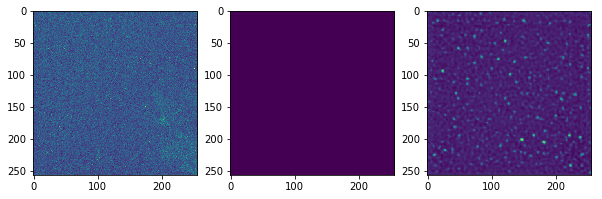

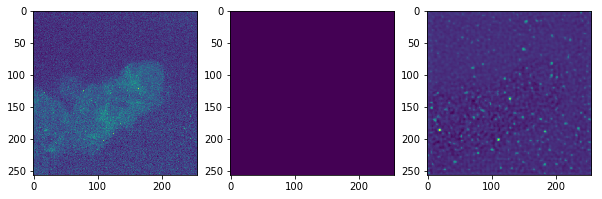

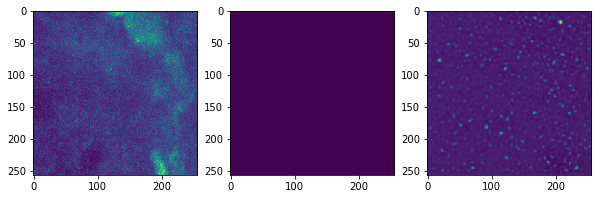

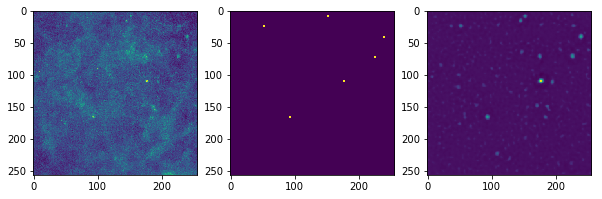

1000
Training loss:  0.000523137
(50, 256, 256, 1)
Validation loss:  0.000170085


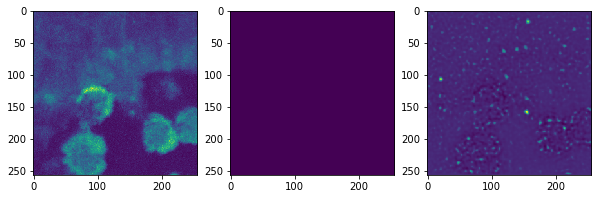

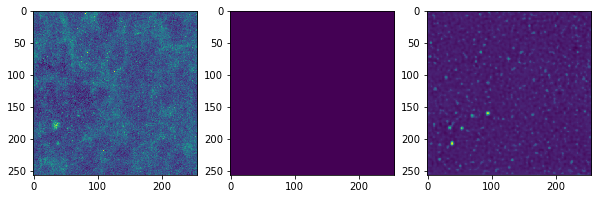

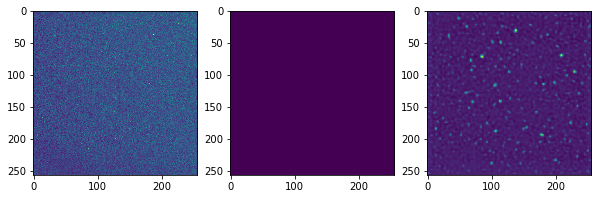

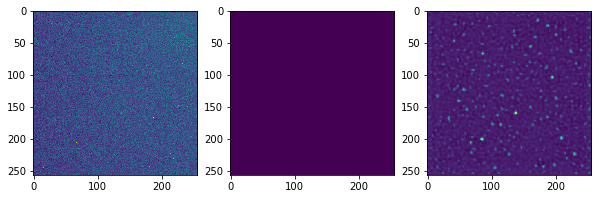

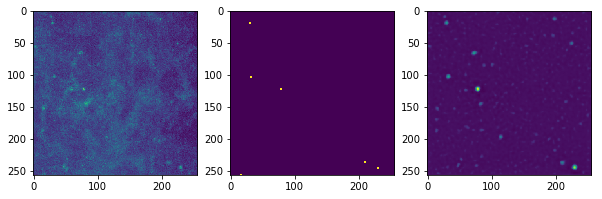

1100
Training loss:  0.000485405
(50, 256, 256, 1)
Validation loss:  0.000261773


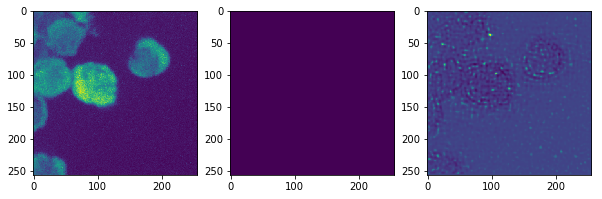

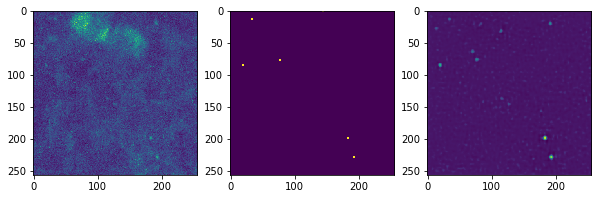

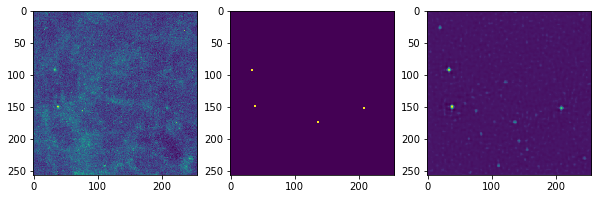

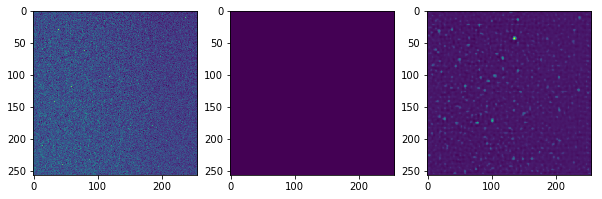

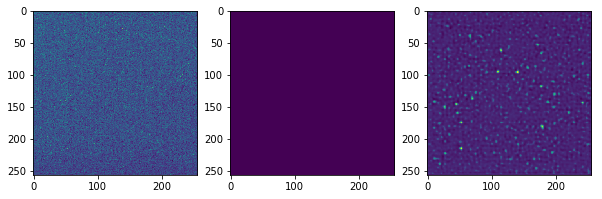

1200
Training loss:  0.000402303
(50, 256, 256, 1)
Validation loss:  0.00020814


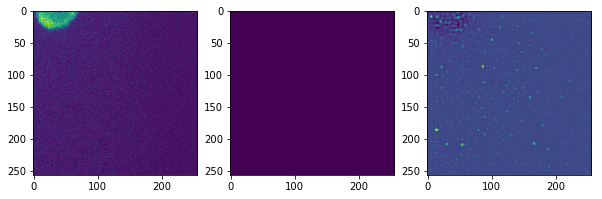

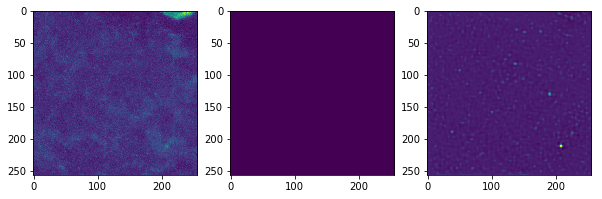

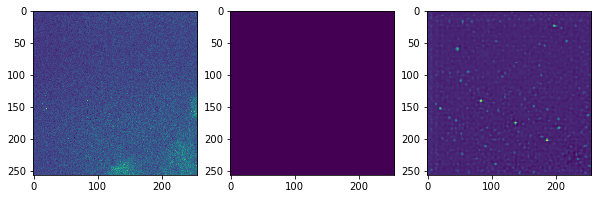

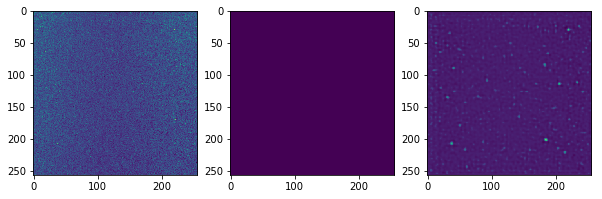

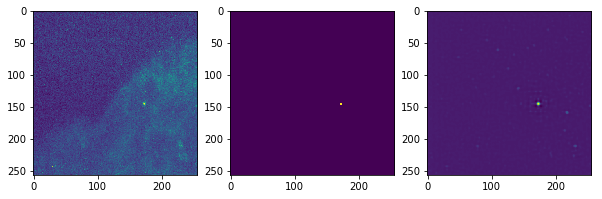

1300
Training loss:  0.000409302
(50, 256, 256, 1)
Validation loss:  0.0001754


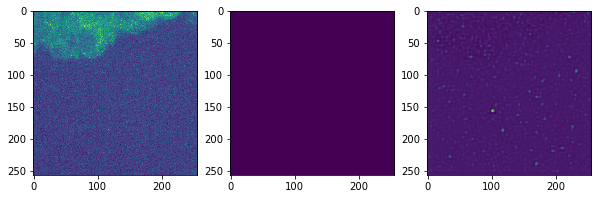

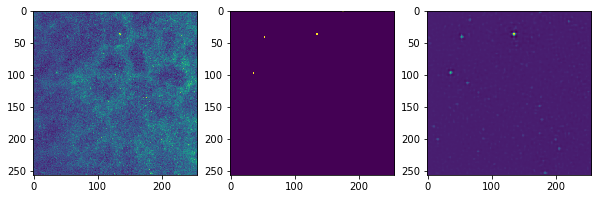

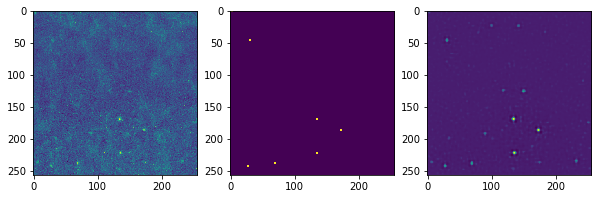

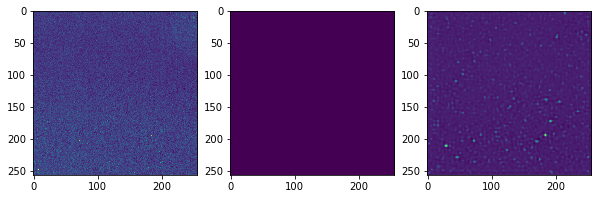

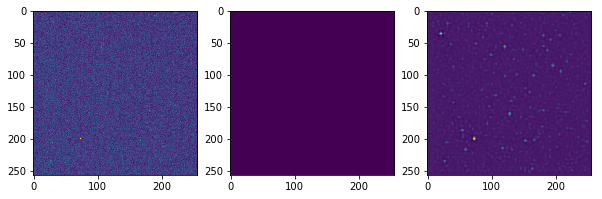

1400
Training loss:  0.000362572
(50, 256, 256, 1)
Validation loss:  0.000182331


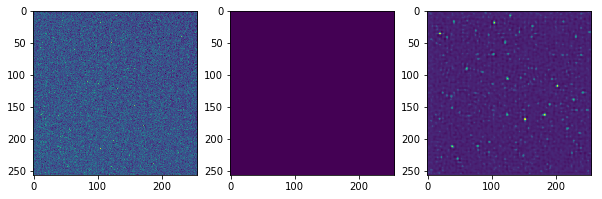

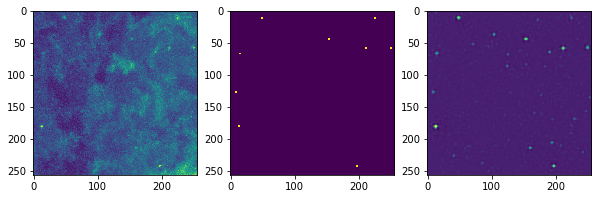

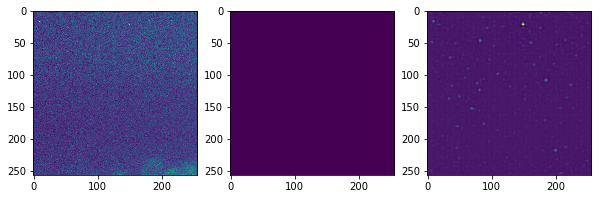

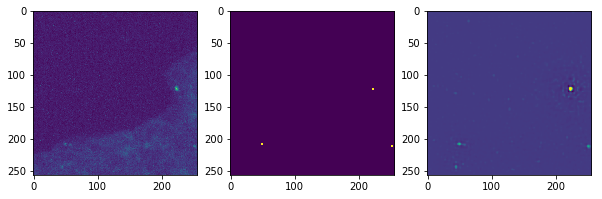

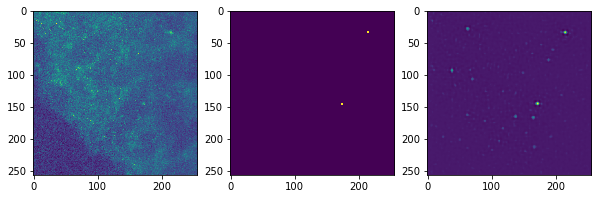

KeyboardInterrupt: 

In [13]:
tf.set_random_seed(123456)
sess=tf.Session()
sess.run(tf.global_variables_initializer())

for i in range(20000):
    idx=np.random.choice(train_data.shape[0], replace=False, size=[50])
    cur_train=train_data[idx,:,:,:]
    cur_truth=train_truth[idx,:,:]
    _,results, losses=sess.run([train_op, probs, loss], feed_dict={x:cur_train, y:cur_truth})
    if (i%100==0):
        print(i)
        print("Training loss: ",losses)
        idx=np.random.choice(validation_data.shape[0], replace=False, size=[50])
        #idx=range(0,300)
        sub_validation_data=validation_data[idx, :,:,:]
        sub_validation_truth=validation_truth[idx, :,:]
        results, losses, a,c=sess.run([probs, loss, A1,C2], feed_dict={x:sub_validation_data, y:sub_validation_truth})
        print(results.shape)
        print("Validation loss: ",losses)
        for ti in range (0,5):
            utils.plot_3x1(sub_validation_data[ti,:,:,0], sub_validation_truth[ti,:,:], results[ti,:,:,0])
            plt.show()

In [15]:
saver = tf.train.Saver()
saver.save(sess, data+'Channel1Model')

'/media/smc/RNAFish/DeepLearning/Channel1Model'

# Use transfer learning on new set

In [ ]:
train_both=utils.get_raw_float_image(data+'TrainingA2.raw',shp)
train_data=train_both[:,:,:,[1,3]]/4096.0
train_truth=train_both[:,:,:,5]/255.0

validation_both=utils.get_raw_float_image(data+'Validation.raw', shp)
validation_data=validation_both[:,:,:,[1,3]]/4096.0
validation_truth=validation_both[:,:,:,5]/255.0

In [ ]:
for i in range(20000):
    idx=np.random.choice(train_data.shape[0], replace=False, size=[50])
    cur_train=train_data[idx,:,:,:]
    cur_truth=train_truth[idx,:,:]
    _,results, losses=sess.run([train_op, probs, loss], feed_dict={x:cur_train, y:cur_truth})
    if (i%100==0):
        print(i)
        print("Training loss: ",losses)
        idx=np.random.choice(validation_data.shape[0], replace=False, size=[50])
        #idx=range(0,300)
        sub_validation_data=validation_data[idx, :,:,:]
        sub_validation_truth=validation_truth[idx, :,:]
        results, losses, a,c=sess.run([probs, loss, A1,C2], feed_dict={x:sub_validation_data, y:sub_validation_truth})
        print(results.shape)
        print("Validation loss: ",losses)
        for ti in range (0,5):
            utils.plot_3x1(sub_validation_data[ti,:,:,0], sub_validation_truth[ti,:,:], results[ti,:,:,0])
            plt.show()

# Process new data

In [29]:
def process_file(sess, file_name):
    true_test2_data=utils.get_raw_float_image(file_name, [1,256,256,7])[:,:,:,[0,3]]/4096.0
    true_test2_truth=utils.get_raw_float_image(file_name, [1,256,256,7])[:,:,:,4]/255.0
    num_images=true_test2_data.shape[0]
    output=np.zeros([num_images,256,256,3])
    process_batch_size=4
    for t in range(0,num_images,process_batch_size):
        endrng=np.min((t+process_batch_size,num_images))
        sub_validation_data=true_test2_data[t:(t+process_batch_size), :,:,:]
        sub_validation_truth=true_test2_truth[t:(t+process_batch_size), :,:]
        results, losses, a=sess.run([probs, loss, A1], feed_dict={x:sub_validation_data, y:sub_validation_truth})
        output[t:(t+process_batch_size),:,:,0]=sub_validation_data[:,:,:,0]
        output[t:(t+process_batch_size),:,:,1]=sub_validation_truth[:,:,:]
        output[t:(t+process_batch_size),:,:,2]=results[:,:,:,0]
    output=np.swapaxes(np.swapaxes(output,3,2),2,1)
    np.place(output, output<0, 0)
    (output*255.0).astype(np.uint8).tofile(file_name[0:-4]+'_output.raw')
    print(file_name[0:-4]+'_output.raw')
    return output


In [30]:
output=process_file(sess,data+'Validation7.raw')

/media/smc/RNAFish/DeepLearning/Validation7_output.raw


In [41]:
output.shape

(441, 3, 256, 256)

In [29]:
shp

[4, 512, 512, 4]

In [25]:
np.place(output, output<0, 0)

In [26]:
np.min(output)

0.0

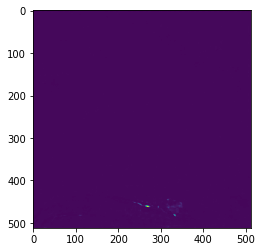

In [19]:
plt.imshow(output[12,2,0,:,:])

In [67]:
true_test2_data=utils.get_raw_float_image(data+'Validation-512.raw', shp)[:,:,:,:,0:2]/16384.0

In [48]:
output.shape

(63, 4, 2, 512, 512)

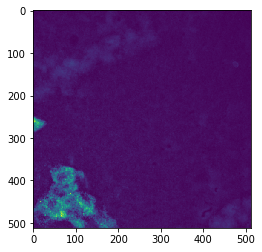

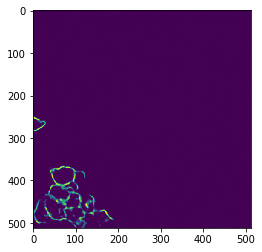

In [75]:
ix=16
plt.imshow(np.max(true_test2_data[ix,:,:,:,0], axis=0))
plt.figure()
plt.imshow(np.max(output[ix,:,0,:,:], axis=0))

In [44]:
tf.saved_model.simple_save(sess, data+'model', inputs={"x":x, "y":y}, outputs={"probs":probs, "loss":loss, "A1":A1})

INFO:tensorflow:Assets added to graph.
INFO:tensorflow:No assets to write.
INFO:tensorflow:SavedModel written to: b'/home/ubuntu/BRS_RNAFish/model/saved_model.pb'


In [ ]:
rest_both=utils.get_raw_float_image(data+'Training-128.raw', shp)
rest_data=rest_both[:,:,:,:,0:2]/16384.0
rest_truth=rest_both[:,:,:,:,2:4]/255.0
rest_both=0

# Trying validation data

In [7]:
sub_range=range(0,3)
sub_validation_data=validation_data[sub_range, :,:,:]
sub_validation_truth=validation_truth[sub_range, :,:,:, :]
results, LN,losses=sess.run([probs, LSQ, loss], feed_dict={x:sub_validation_data, y:sub_validation_truth})
losses

0.0011763077

36


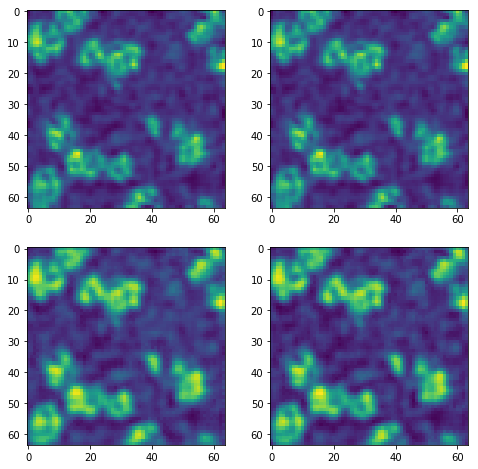

In [10]:
z=2
ix=random.randint(1,90)
print(ix)
ix=0
utils.plot_2x2(sub_validation_data[ix,z,:,:], sub_validation_truth[ix,z,:,:,1], (0.01+results[ix,z,:,:,0]), (0.01+results[ix,z,:,:,1]))
z=z+1



Trying on Bony images

In [94]:
sub_validation_data.shape

(100, 64, 64)

In [56]:
blobs=read_tiff('3DPlanariaD.tif',16)
blobs=blobs.reshape([1,16,64,64])
blobs=(blobs-np.mean(blobs))/np.std(blobs)
blobs=((blobs*.34+0.13))
blobgarb=sub_validation_truth[0:1,:,:,:,:]
print(np.mean(blobs))
print(np.std(blobs))
blobgarb.shape
blobs.shape

0.13
0.3400000000000001


(1, 16, 64, 64)

In [57]:
results, LN,losses=sess.run([probs, LSQ, loss], feed_dict={x:blobs, y:blobgarb})

1

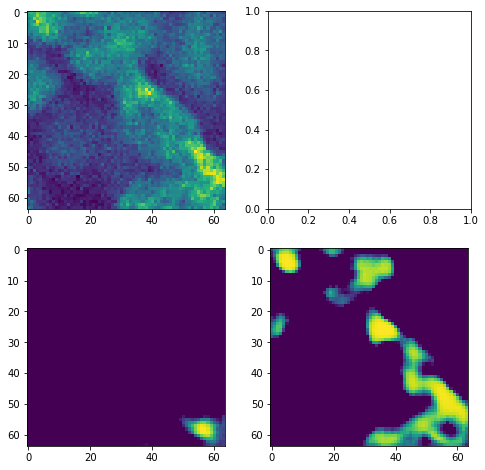

In [58]:
z=5

f,axes=plt.subplots(2,2, figsize=(8,8))
axes[0,0].imshow(blobs[0,z,:,:])
#axes[0,1].imshow(blobgarb[0,:,:,1])
axes[1,0].imshow((0.01+results[0,z,:,:,0]))
axes[1,1].imshow((0.5+results[0,z,:,:,1]))
ix=ix+1
ix

In [59]:
for i in range(0,16):
    im=Image.fromarray(results[0,i,:,:,0])
    im.save('output_planariaDM/MaskB'+str(i)+'.tif', "TIFF")
    im=Image.fromarray(results[0,i,:,:,1])
    im.save('output_planariaDM/OutlineB'+str(i)+'.tif', "TIFF")
